# Исследование рынка общепита Москвы

Данное исследование было проведено на основании набора данных о заведениях общественного питания Москвы, составленный на основе данных нескольких сервисов, связанных с бизнесом и картами, на лето 2022 года. Этот датасет содержит всю основную информацию о местоположении, графике работы, рейтинге, ценовом сегменте заведения и пр. Данное исследование направленно на изучение рынка общепита и последующее использования полученных данных при открытии новых заведений.

<div class="alert alert-success">
<b> Ссылка на презентацию по результатам исследования:https://disk.yandex.ru/i/_pmnOsMViqhi6A

# 1. Загрузка данных.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
from folium import Marker, Map, Choropleth 
from folium.plugins import MarkerCluster

msc_plc=pd.read_csv('/datasets/moscow_places.csv')


In [2]:
msc_plc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
print(msc_plc['name'].value_counts ())

Кафе                  189
Шоколадница           120
Домино'с Пицца         76
Додо Пицца             74
One Price Coffee       71
                     ... 
РестоБар Argomento      1
Кофейня Enjoy           1
Транзит Времени         1
СУП кафе                1
Maya                    1
Name: name, Length: 5614, dtype: int64


Датафрейм содержит данные о 8406 заведениях в Москве, при этом часть названий дублируется, но скорее всего это связанно с тем, что большинство таких случаев-это сетевые заведения с одним названием, либо как в случае с 'Кафе', это заведения без полноценного названия. Перейдем к предобработке данных и проверим есть в них ошибки и дубликаты.

# 2. Предобработка данных

In [4]:
print('\nЧисло дубликатов:',msc_plc.duplicated().sum())


Число дубликатов: 0


array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

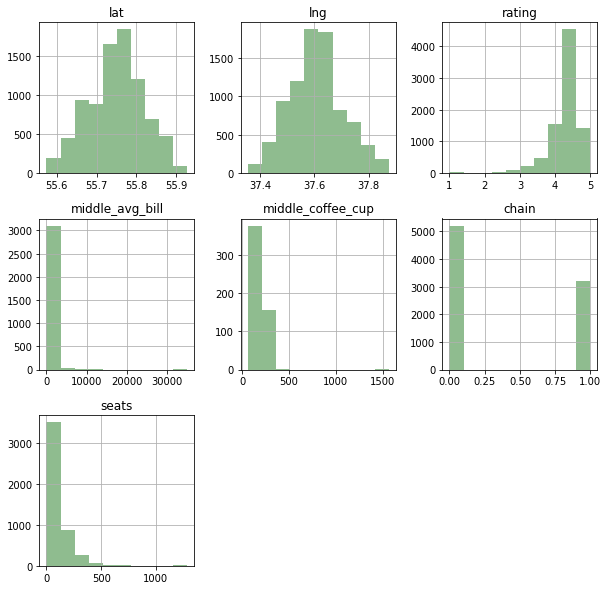

In [5]:
msc_plc.hist(figsize=(10, 10), color='darkseagreen')

In [6]:
msc_plc.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Дубликатов в данных нет, но в некоторых столбцах присутсвует большое количество пропусков.

 Мы не можем заполнить информацию в столбце с графиком работы, поскольку предугадать такую информацию по другим доступным данным невозможно, а заполнить его медианными данными было бы некорректно. Такая же ситуация обстоит со столбцом средней цены на кофе, она определяется по информации из другого столбца и если ее у нас нет, мы ничем не можем заполнить пропуски в этом столбце.

Но мы можем попробовать заполнить часть пропусков в столбцах с ценовой категорией заведений, средним чеком и его диапазоном, если хотя бы в одном из них есть данные.

In [7]:
print('Количество строк с данными о диапазоне среднего чека, но без данных о ценовом сегменте:',msc_plc['price'].
      loc[(msc_plc['price'].isnull()) & (msc_plc['avg_bill'].notnull())].count())

Количество строк с данными о диапазоне среднего чека, но без данных о ценовом сегменте: 0


In [8]:
print('Количество строк с данными о среднем чеке, но без данных о ценовом сегменте:', 
      msc_plc['price'].loc[(msc_plc['price'].isnull()) & (msc_plc['middle_avg_bill'].notnull())].count())

Количество строк с данными о среднем чеке, но без данных о ценовом сегменте: 0


In [9]:
print('Количество строк с данными о диапазоне среднего чека, но без данных о среднем чеке:',
      msc_plc['avg_bill'].loc[(msc_plc['avg_bill'].notnull()) & (msc_plc['middle_avg_bill'].isnull())].count())

Количество строк с данными о диапазоне среднего чека, но без данных о среднем чеке: 667


In [10]:
print(msc_plc['avg_bill'].loc[(msc_plc['avg_bill'].notnull()) & (msc_plc['middle_avg_bill'].isnull())].unique())

['Цена чашки капучино:155–185 ₽' 'Цена бокала пива:250–350 ₽'
 'Цена бокала пива:120–350 ₽' 'Цена чашки капучино:150–190 ₽'
 'Цена чашки капучино:120–170 ₽' 'Цена чашки капучино:100–200 ₽'
 'Цена бокала пива:90–230 ₽' 'Цена чашки капучино:150–210 ₽'
 'Цена чашки капучино:80–160 ₽' 'Цена чашки капучино:100 ₽'
 'Цена чашки капучино:239–274 ₽' 'Цена чашки капучино:130–190 ₽'
 'Цена бокала пива:160–499 ₽' 'Цена чашки капучино:200–300 ₽'
 'Цена чашки капучино:150–180 ₽' 'Цена чашки капучино:119–179 ₽'
 'Цена чашки капучино:100–170 ₽' 'Цена чашки капучино:200–240 ₽'
 'Цена чашки капучино:150–200 ₽' 'Цена бокала пива:199–300 ₽'
 'Цена бокала пива:от 140 ₽' 'Цена бокала пива:от 149 ₽'
 'Цена бокала пива:150–450 ₽' 'Цена чашки капучино:150–240 ₽'
 'Цена чашки капучино:от 60 ₽' 'Цена чашки капучино:120–180 ₽'
 'Цена чашки капучино:179–249 ₽' 'Цена чашки капучино:75 ₽'
 'Цена чашки капучино:от 89 ₽' 'Цена чашки капучино:90–100 ₽'
 'Цена чашки капучино:149–259 ₽' 'Цена чашки капучино:120 ₽'
 'Цена

К сожалению, по средним ценам на те или иные напитки заполнить данные пропуски было бы некорректно.


In [11]:
print(msc_plc['middle_avg_bill'].loc[(msc_plc['middle_avg_bill'].notnull()) & (msc_plc['price'].isnull())].count())

470


In [12]:
print(msc_plc['middle_avg_bill'].loc[(msc_plc['middle_avg_bill'].notnull()) & (msc_plc['price'].isnull())].unique())

[ 240.  328.  500.  900.  300.  349.  269.  750.  355.  200.  275. 1250.
  600.  425.  150.  250.  362.  291.  280.  325. 1000.  321.  317.  650.
  324.  350.  343.  140.  120.  165.  225.  549.  400.  313.  450.  130.
  344.  185. 1750.  875.  480.  175.  550.  404.  366.  560.  315.  363.
  260. 2900.  375. 2200.  850.  426.  320.  352.  443.   50.  365. 1200.
 1075.  110.  495.   67.  255.  525.  391. 2250.  407.  330.  209.  422.
  415. 2500.  432.  310.  465.  270.  374.  199.  412.  335. 1100. 1500.
 2000.  675.  385.  360. 1225.  475.  382. 1050. 1700.  700.  910. 2100.
 4000. 2600.  340. 1600.  220.  975. 1800.  301.  800.  433.  339.  410.
  285.  245. 1400.  508.  472. 1300.  441.  265.  860.  434.  503.  373.
  135.  392.  155.  402.  370.  453.  205.  439.   30.  298.  416.  266.
  170.  372. 1150.  625.  230.  305.  125.]


Но в данных есть 470 строк, где указан средний чек в заведении, так что по усредненным данным остального датасета, мы можем заполнить графу о ценовой категории заведения. При причислении к той или иной категории будем ориентироваться на максимальный средний чек каждой категории.

In [13]:
pivot_data=msc_plc[msc_plc['middle_avg_bill'].notna()]
pivot_t=pivot_data.pivot_table(index='price', values=['middle_avg_bill'],aggfunc=['mean', 'median', 'min', 'max'])
pivot_t.columns = ['mean', 'median', 'min', 'max']
print(pivot_t)

                      mean  median    min      max
price                                             
высокие        2472.631579  2000.0    0.0  35000.0
выше среднего  1344.189189  1250.0  375.0   4500.0
низкие          217.311828   180.0   90.0    600.0
средние         598.908273   500.0  165.0   2150.0


In [14]:
def categorize_price(middle_avg_bill):
    if middle_avg_bill<=600:
        return 'низкие'
    if middle_avg_bill<=2150:
        return 'средние'
    if middle_avg_bill<=4500:
        return 'выше среднего'
    if middle_avg_bill>4500:
        return 'высокие'
    else:
        return 'неизвестно'
    

In [15]:
msc_plc['price']=msc_plc['price'].fillna(msc_plc['middle_avg_bill'].apply(categorize_price))

In [16]:
msc_plc.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                   0
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [17]:
msc_plc['is_chain']=msc_plc['chain'].replace(to_replace=[0, 1], value=['не сеть','сеть'])


Выделяем из столбца с адресами улицы и проверяем, как они отображаются в новом столбце.

In [18]:
msc_plc['street']=msc_plc['address'].str.split(',').str[1]
msc_plc['street'].unique()

array([' улица Дыбенко', ' Клязьминская улица',
       ' улица Маршала Федоренко', ..., ' улица Хлобыстова',
       ' Новороссийская улица', ' Чонгарский бульвар'], dtype=object)

In [19]:
msc_plc['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [20]:
msc_plc['hours'].value_counts ()

ежедневно, 10:00–22:00                               759
ежедневно, круглосуточно                             730
ежедневно, 11:00–23:00                               396
ежедневно, 10:00–23:00                               310
ежедневно, 12:00–00:00                               254
                                                    ... 
пн-пт 11:00–00:00; сб,вс 11:00–06:00                   1
пн-пт 08:20–21:30; сб,вс 10:00–21:30                   1
пн-чт 11:00–02:00; пт-вс 11:00–03:00                   1
пн-пт 08:00–20:00; сб 09:00–21:00; вс 09:00–20:00      1
пн-пт 07:45–20:00; сб,вс 10:00–20:00                   1
Name: hours, Length: 1307, dtype: int64

Добавляем столбец 24/7 и проверяем его соответсвие первоначальным данным(в обоих столбцах круглосуточных заведений 730).

In [21]:
msc_plc['is_24/7']=msc_plc['hours'].isin(msc_plc.loc[msc_plc['hours'].eq('ежедневно, круглосуточно'),'hours'])
msc_plc['is_24/7'].value_counts ()

False    7676
True      730
Name: is_24/7, dtype: int64

# 3. Анализ данных

In [22]:
sns.set_theme(style="whitegrid")

                count
                 name
category             
бар,паб           765
булочная          256
быстрое питание   603
кафе             2378
кофейня          1413
пиццерия          633
ресторан         2043
столовая          315


<AxesSubplot:title={'center':'Кол-во заведений в разных категориях'}, ylabel='Категории заведений'>

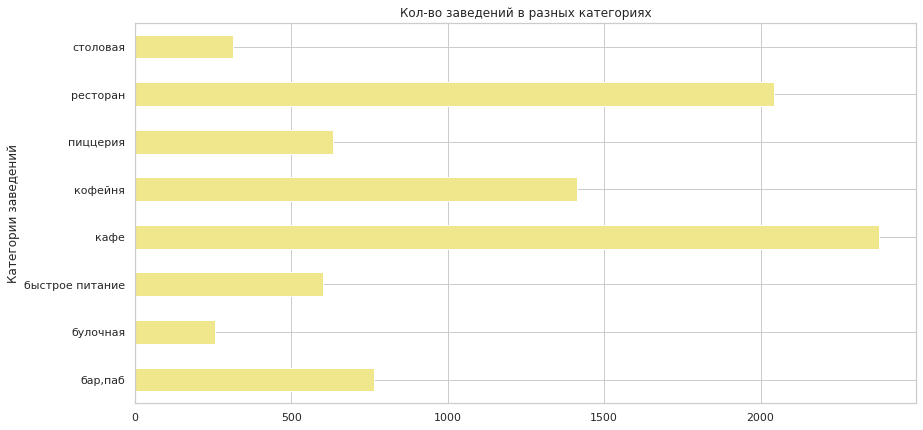

In [23]:
pivot_table_1=msc_plc.pivot_table(index='category', values='name',aggfunc=['count'])
print(pivot_table_1)
pivot_table_1.plot(kind='barh', y='count', figsize=(14, 7), color=['khaki'],xlabel ="Категории заведений", 
                   ylabel = "Кол-во заведений", title ='Кол-во заведений в разных категориях',legend=None)

Наиболее распространены в Москве кафе и рестораны, наименее - булочные и столовые.

                       mean median
                      seats  seats
category                          
бар,паб          124.532051   82.5
булочная          89.385135   50.0
быстрое питание   98.891117   65.0
кафе              97.512315   60.0
кофейня          111.199734   80.0
пиццерия          94.496487   55.0
ресторан         121.944094   86.0
столовая          99.750000   75.5


<AxesSubplot:title={'center':'Среднее кол-во посадочных мест в разных категориях заведений'}, xlabel='Категории заведений', ylabel='Среднее кол-во посадочных мест'>

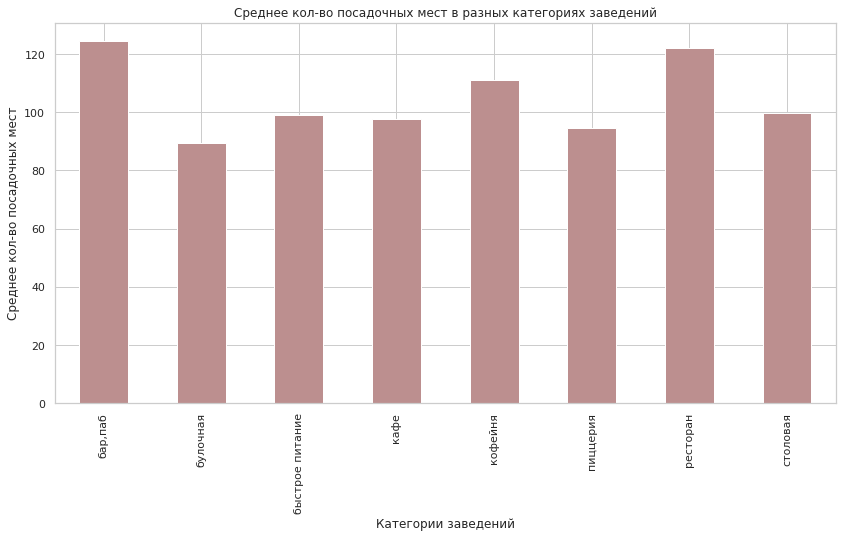

In [24]:
pivot_table_2=msc_plc.pivot_table(index='category', values='seats',aggfunc=['mean','median'])
print(pivot_table_2)
pivot_table_2.plot(kind='bar', y='mean', figsize=(14, 7), color=['rosybrown'],xlabel ="Категории заведений", 
                   ylabel = "Среднее кол-во посадочных мест", title ='Среднее кол-во посадочных мест в разных категориях заведений',legend=None)

Лидером по количеству посадочных мест среди представленных категорий заведений являются: рестораны, бары и кофейни. Меньше всего посадочных мест, ожидаемо, в булочных, поскольку такой формат заведения не редко предполагает продажу еды на вынос.

         count
          name
is_chain      
не сеть   5201
сеть      3205


<AxesSubplot:title={'center':'Сетевые и не сетевые заведения Москвы'}, ylabel=' '>

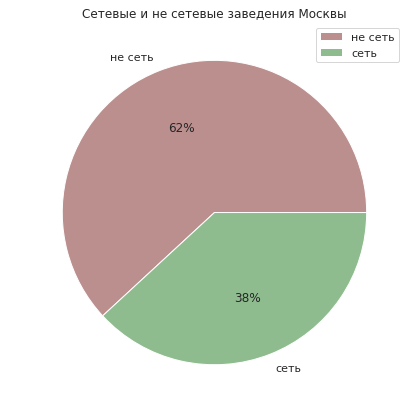

In [25]:
pivot_table_3=msc_plc.pivot_table(index='is_chain', values='name',aggfunc=['count'])
print(pivot_table_3)
pivot_table_3.plot(kind='pie', y='count', figsize=(14, 7), autopct='%1.0f%%', colors=['rosybrown','darkseagreen'] , 
                   ylabel=' ', title ='Сетевые и не сетевые заведения Москвы',legend='Принадлежность к сети')


Преимущественно в датасете присутсвуют не сетевые заведения, лишь 38% являютя сетевыми.

In [26]:
pivot_table_4=msc_plc.pivot_table(index=['category','is_chain'], values='name',aggfunc=['count'])
pivot_table_4.columns = pivot_table_4.columns.droplevel(0)
pivot_table_4 = pivot_table_4.reset_index().rename_axis(None, axis=1)


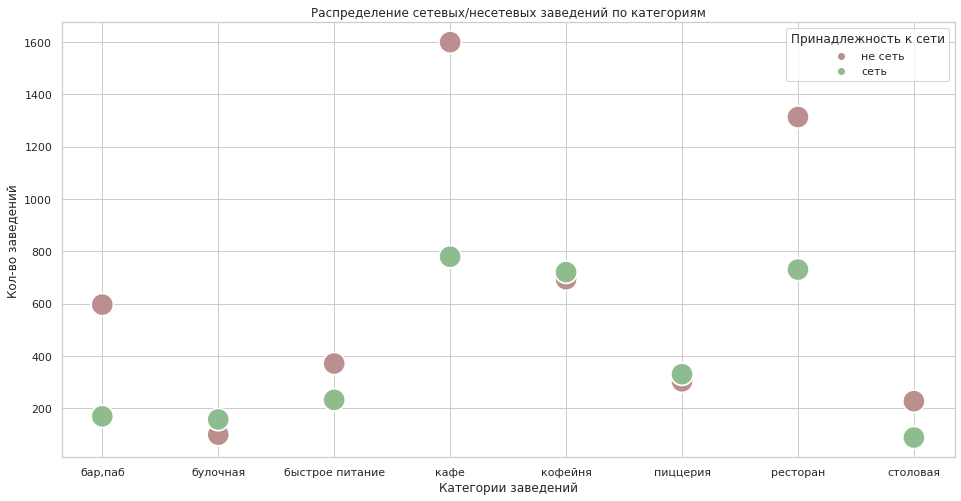

In [27]:
fig = plt.gcf()

fig.set_size_inches(16, 8)
graph_5=sns.scatterplot(data=pivot_table_4, x='category', y='name', hue='is_chain', 
                        palette=['rosybrown','darkseagreen'], s=500)
graph_5.set(xlabel ="Категории заведений", ylabel = "Кол-во заведений", 
            title ='Распределение сетевых/несетевых заведений по категориям')
graph_5.legend(title="Принадлежность к сети")

Соотношение сетевых и не сетевых заведений практически равное в таких категориях, как пиццерия, кофейни и булочные. Сильно разнится оно у кафе, баров и ресторанов, среди них не сетевые заведения встречаются значительно чаще.

In [28]:
chains=msc_plc.loc[(msc_plc['is_chain'] =='сеть')].copy()
msc_plc_grouping = chains.groupby('name')['address'].count().sort_values(ascending=False).to_frame()
msc_plc_grouping = msc_plc_grouping.reset_index().rename_axis(None, axis=1)
msc_plc_grouping.columns =['name','place count']
msc_plc_grouping.head(15)

,name,place count
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [29]:
top15_chains=msc_plc_grouping.loc[:14].copy()

[Text(0.5, 0, 'Кол-во заведений'),
 Text(0, 0.5, 'Название сети'),
 Text(0.5, 1.0, 'Топ-15 сетей по количеству заведений в Москве')]

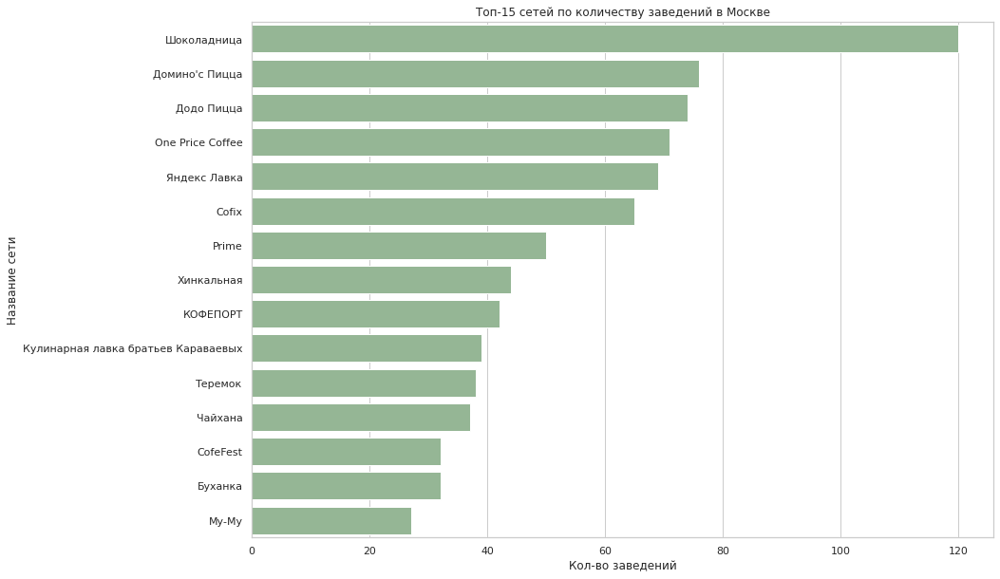

In [30]:
f, ax = plt.subplots(figsize=(14, 10))
graph_6=sns.barplot(data=top15_chains, x='place count', y='name', palette=['darkseagreen'])
graph_6.set(xlabel ="Кол-во заведений", ylabel = "Название сети", title ='Топ-15 сетей по количеству заведений в Москве')

In [31]:
best_chains_names=top15_chains['name']. tolist ()

In [32]:
top_chains_data=msc_plc.loc[(msc_plc['name'].isin(best_chains_names))].copy()

In [33]:
top_chains_data.groupby('category')['address'].count().sort_values(ascending=False)

category
кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: address, dtype: int64

In [34]:
top_chains_data.groupby('price')['address'].count().sort_values(ascending=False)

price
неизвестно       466
средние          216
низкие           126
выше среднего      6
высокие            2
Name: address, dtype: int64

In [35]:
top_chains_data.groupby('district')['address'].count().sort_values(ascending=False)

district
Центральный административный округ         214
Южный административный округ                89
Западный административный округ             88
Северный административный округ             88
Северо-Восточный административный округ     85
Восточный административный округ            80
Юго-Западный административный округ         70
Юго-Восточный административный округ        56
Северо-Западный административный округ      46
Name: address, dtype: int64

In [36]:
top_chains_data.groupby('rating')['address'].count().sort_values(ascending=False)

rating
4.2    208
4.3    177
4.1    153
4.4     70
4.0     67
3.9     29
4.5     22
3.8     15
3.7     10
3.5      8
4.9      7
4.6      7
4.7      6
3.6      5
3.3      4
4.8      4
3.0      3
2.8      3
2.7      3
3.4      2
3.2      2
2.9      2
2.5      2
2.3      2
2.0      2
1.9      1
3.1      1
1.7      1
Name: address, dtype: int64

Названия наиболее распространненых в Москве сетей мне действительно знакомы. Помимо хорошей узнаваемости эти сети объединяет то, что большинство из них - кофейни и рестораны в среднем или низком ценовом сегменте. Также для ресторанов данных сетей характерен и высокий(>4) средний рейтинг.

                                        count
                                         name
district                                     
Восточный административный округ          798
Западный административный округ           851
Северный административный округ           900
Северо-Восточный административный округ   891
Северо-Западный административный округ    409
Центральный административный округ       2242
Юго-Восточный административный округ      714
Юго-Западный административный округ       709
Южный административный округ              892


<AxesSubplot:title={'center':'Кол-во заведений в разный районах Москвы'}, ylabel='Районы Москвы'>

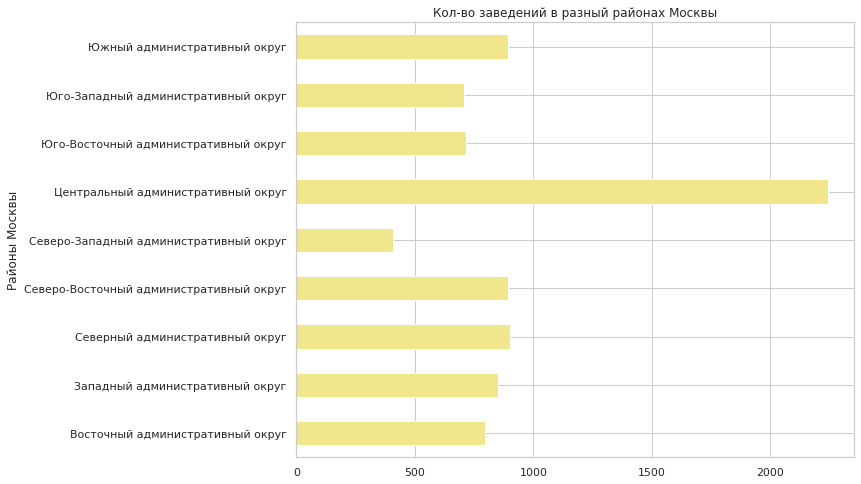

In [37]:
pivot_table_5=msc_plc.pivot_table(index='district', values='name',aggfunc=['count'])
print(pivot_table_5)
pivot_table_5.plot(kind='barh', y='count', figsize=(10, 8), color='khaki', xlabel = "Районы Москвы",
                   title ='Кол-во заведений в разный районах Москвы',legend=None)

Большая часть заведений сосредоточена в Центральном административном округе Москвы, меньше всего их в Северо-Западном округе, количество в остальных районах примерно равное, от 709 до 900 заведений.

In [38]:
pivot_table_6=msc_plc.pivot_table(index=['district','category'], values='name',aggfunc=['count'])
pivot_table_6.columns = pivot_table_6.columns.droplevel(0)
pivot_table_6 = pivot_table_6.reset_index().rename_axis(None, axis=1)

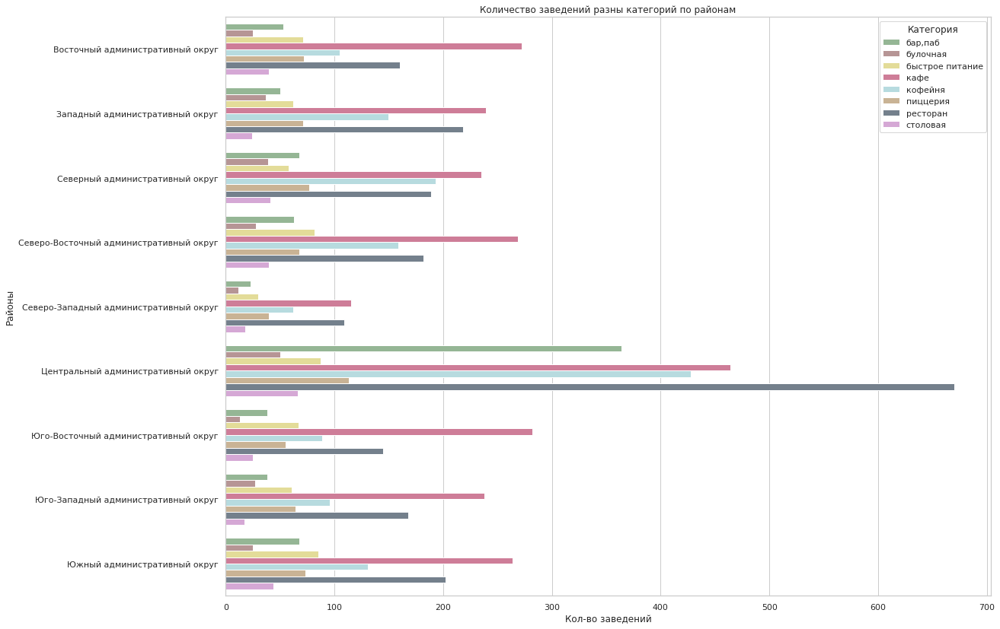

In [39]:
fig_2 = plt.gcf()

fig_2 .set_size_inches(18, 14)
graph_7=sns.barplot(data=pivot_table_6, x='name', y='district', hue='category', 
                    palette=['darkseagreen','rosybrown','khaki','palevioletred','powderblue','tan','slategrey','plum'] )
graph_7.set(xlabel ="Кол-во заведений", ylabel = 'Районы', title ='Количество заведений разны категорий по районам')
graph_7.legend(title="Категория")

В Центральном округе преобладают рестораны, в остальных районах Москвы чаще встречаются кафе, за ними во всех районахследуют рестораны и кофейни, только в Северном районе количество кофеен опережает количество ресторанов.

In [40]:
pivot_table_7=msc_plc.pivot_table(index=['category'], values='rating',aggfunc=['mean'])
pivot_table_7.columns = pivot_table_7.columns.droplevel(0)
pivot_table_7 = pivot_table_7.reset_index().rename_axis(None, axis=1)


[Text(0.5, 0, 'Категории'),
 Text(0, 0.5, 'Средний рейтинг заведений'),
 Text(0.5, 1.0, 'Распределение среднего рейтинга заведений по категориям')]

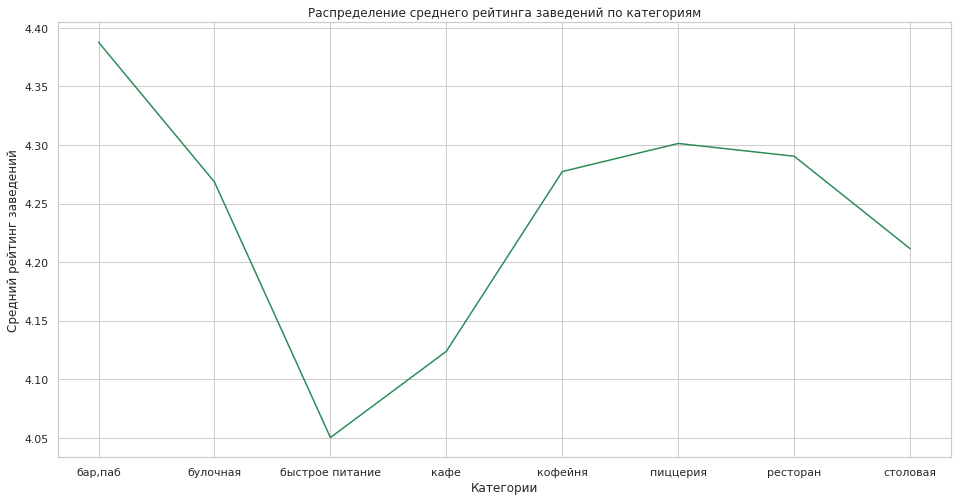

In [41]:
fig_3 = plt.gcf()

fig_3 .set_size_inches(16, 8)
graph_8=sns.lineplot(x='category', y='rating',data=pivot_table_7, color='seagreen')
graph_8.set(xlabel ="Категории", ylabel = 'Средний рейтинг заведений', 
            title ='Распределение среднего рейтинга заведений по категориям')

Наиболее высокий рейтинг у баров и пабов, почти 4.4, самые низкие оценки получают заведения быстрого питания, в среднем около 4.05. Относительно низкие рейтинги в среднем получают кафе-4.13 и столовые-4.22. Остальные категории заведений получаются примерно схожие оценки в промежутке между 4.27 и 4.30.

In [42]:
pivot_table_8=msc_plc.pivot_table(index=['district'], values='rating',aggfunc=['mean'])
pivot_table_8.columns = pivot_table_8.columns.droplevel(0)
pivot_table_8 = pivot_table_8.reset_index().rename_axis(None, axis=1)
pivot_table_8

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [43]:

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=pivot_table_8,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Самые высокие средние рейтинги у заведений в Центральном округе столице, за ним следует Северный район. Ниже всего средние рейтинги у заведений Юго-Восточного округа столицы.

In [44]:


from folium.plugins import MarkerCluster


moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


msc_plc.apply(create_clusters, axis=1)


m

In [45]:
streets_grouping = msc_plc.groupby('street')['address'].count().sort_values(ascending=False).to_frame()
streets_grouping = streets_grouping.reset_index().rename_axis(None, axis=1)
streets_grouping.columns =['street','place count']
top15_streets=streets_grouping.loc[:14].copy()
top15_streets

,street,place count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [46]:
best_streets_names=top15_streets['street']. tolist ()
top_streets_data=msc_plc.loc[(msc_plc['street'].isin(best_streets_names))].copy()

In [47]:
top_streets_cat=top_streets_data.pivot_table(index='street',columns='category', values='name',aggfunc='count')
top_streets_cat.columns.name = None

top_streets_cat

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


In [48]:
top_streets_cat.fillna(0)

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


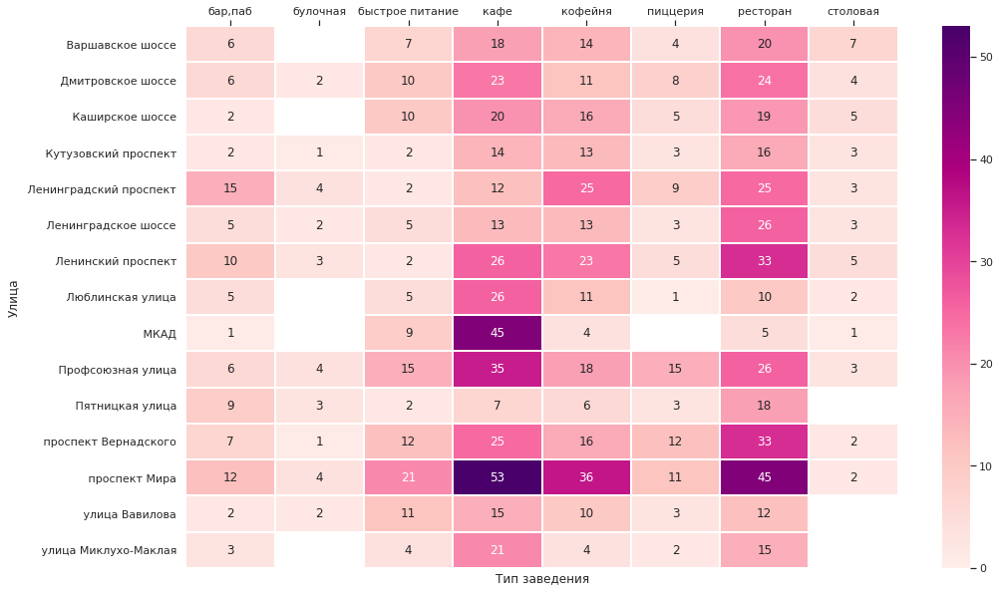

In [49]:
fig_4 = plt.gcf()

fig_4 .set_size_inches(16, 10)
ax = sns.heatmap(top_streets_cat, annot=True, vmin=0, vmax=53, center= 25, cmap= 'RdPu', linewidths=1, linecolor='white')
ax.set(xlabel="Тип заведения", ylabel="Улица")
ax.xaxis.tick_top()

Наиболее распространены на данных улицах заведения категорий кафе, рестораны и кофейни. Больше всего кафе, кофеен и ресторанов на проспекте Мира. Лидером по количеству баров и пабов является Ленинградский проспект, пиццерий-Профсоюзная улица, столовых - Каширское шоссе.

In [50]:
one_cafe_streets=streets_grouping.loc[streets_grouping['place count']==1].copy()
print(one_cafe_streets)

                        street  place count
990             улица Фотиевой            1
991              улица Фадеева            1
992     улица Кирпичные Выемки            1
993                сад Эрмитаж            1
994         улица Ивана Франко            1
...                        ...          ...
1443     Павелецкая набережная            1
1444   Панкратьевский переулок            1
1445           Парусный проезд            1
1446        Певческий переулок            1
1447                       № 7            1

[458 rows x 2 columns]


In [51]:
one_cafe_streets_names=one_cafe_streets['street']. tolist ()
one_cafe_data=msc_plc.loc[(msc_plc['street'].isin(one_cafe_streets_names))].copy()


In [52]:
one_cafe_data.groupby('category')['address'].count().sort_values(ascending=False)

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: address, dtype: int64

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

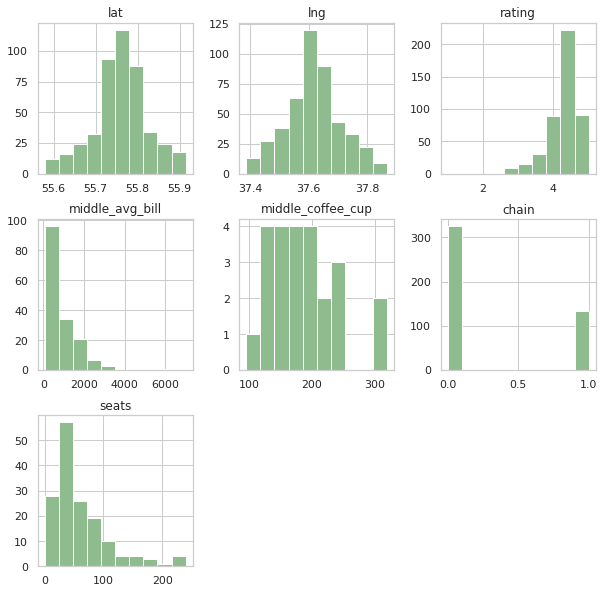

In [53]:
one_cafe_data.hist(figsize=(10, 10), color='darkseagreen')

In [54]:
one_cafe_data.groupby('district')['address'].count().sort_values(ascending=False)

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: address, dtype: int64

In [55]:
one_cafe_data.groupby('hours')['address'].count().sort_values(ascending=False)

hours
ежедневно, круглосуточно             31
ежедневно, 10:00–22:00               25
ежедневно, 11:00–23:00               24
ежедневно, 12:00–00:00               20
ежедневно, 10:00–23:00               15
                                     ..
пн-пт 08:00–20:00; сб 09:00–15:00     1
пн-пт 08:00–20:00                     1
пн-пт 08:00–19:30                     1
пн-пт 08:00–18:30                     1
ср 08:00–20:00                        1
Name: address, Length: 178, dtype: int64

In [56]:
one_cafe_data.groupby('price')['address'].count().sort_values(ascending=False)

price
неизвестно       260
средние          125
выше среднего     29
высокие           22
низкие            22
Name: address, dtype: int64

In [57]:
one_cafe_data.groupby('rating')['address'].count().sort_values(ascending=False)

rating
4.3    84
4.4    56
4.2    54
4.1    49
4.7    28
4.5    28
4.0    25
4.6    21
4.9    19
3.9    15
3.8    12
4.8    12
5.0    11
3.7     9
3.6     5
3.3     5
3.5     4
3.0     4
2.8     4
3.4     3
2.9     3
3.2     2
1.4     1
3.1     1
2.7     1
2.6     1
1.0     1
Name: address, dtype: int64

In [58]:
one_cafe_data.groupby('is_chain')['address'].count().sort_values(ascending=False)

is_chain
не сеть    325
сеть       133
Name: address, dtype: int64

В основном улицы с одним заведением находятся в центре города, это не сетевые кафе, средней ценовой категории и рейтингом выше 4.

In [59]:
district_grouping = msc_plc.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).to_frame()
district_grouping = district_grouping.reset_index().rename_axis(None, axis=1)
district_grouping.columns =['district','median_bill']
district_grouping

,district,median_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [60]:

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=district_grouping,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

m

Наиболее высокие средние чеки встречаются в Центральном и Западном административных округах, в остальных случаях отдаление от центра несет за собой снижение среднего чека, дешевле всего можно поесть на юге, юго-востоке и северо-востоке города.

Таким образом мы проанализировали полученный набор данных и выяснили, что:
   1. Наиболее распространены в городе кафе и рестораны, наименее - булочные. Больше 60% из этих заведений-не сетевые, лишь в 3 из 8 категорий заведений преобладают сетевые заведения.
   2. Среднее количество посадчоных мест не сильно разнится среди категорий заведений, больше всего их в ресторанах и барах, меньше всего-в булочных и пиццериях, которые не редко предполагают продажу еды на вынос.
   3. В Москве широко распространены сетевые заведения, у самой большой сети, Шоколадницы, в столице у них 120 заведений. Топ-15 сетей Москвы объединяет то, что многие из них относятся к категориям кофеен, ресторанов и пиццерий. Это в основном заведения среднего или низкого ценового сегмента с рейтингом выше 4.0.
   4. Большая часть заведений сосредоточена в Центральном административном округе Москвы, меньше всего их в Северо-Западном округе. В Центральном округе преобладают рестораны, в остальных районах Москвы чаще встречаются кафе, за ними во всех районах следуют рестораны и кофейни.
   5. Наиболее высокий средний рейтинг у баров и пабов, самые низкие оценки получают заведения быстрого питания, в среднем около 4.05. Самые высокие средние рейтинги у заведений в Центральном округе, ниже всего средние рейтинги у заведений Юго-Восточного округа столицы.
   6. Больше всего заведений находится на проспекте Мира, Профсоюзной и проспекте Вернадского. Первый является лидером по количеству кафе, кофеен и ресторанов.
   7. В основном улицы с одним заведением находятся в центре города, это не сетевые кафе, средней ценовой категории и рейтингом выше 4.
   8. Наиболее высокие средние чеки встречаются в Центральном и Западном административных округах, в остальных случаях отдаление от центра несет за собой снижение среднего чека.
   

# 4. Открытие кофейни.

In [61]:
coffee_data=msc_plc.loc[msc_plc['category']=='кофейня'].copy().reset_index()

array([[<AxesSubplot:title={'center':'index'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>],
       [<AxesSubplot:title={'center':'rating'}>,
        <AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>],
       [<AxesSubplot:title={'center':'chain'}>,
        <AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>]],
      dtype=object)

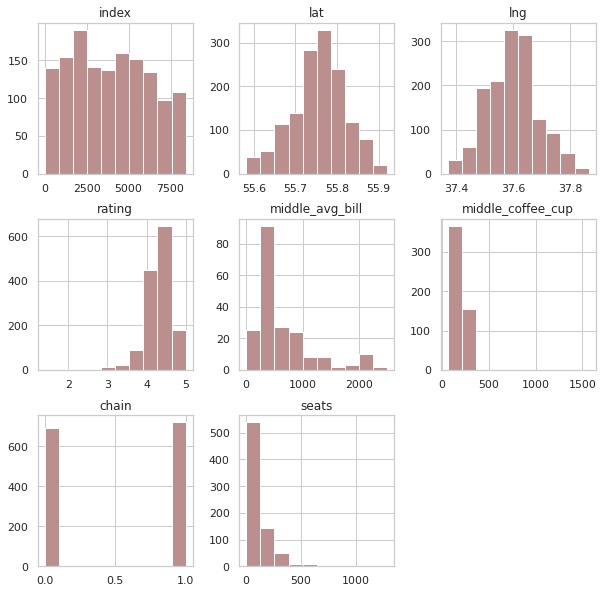

In [62]:
coffee_data.hist(figsize=(10, 10), color='rosybrown')

Всего в датасете: 1413 кофеен


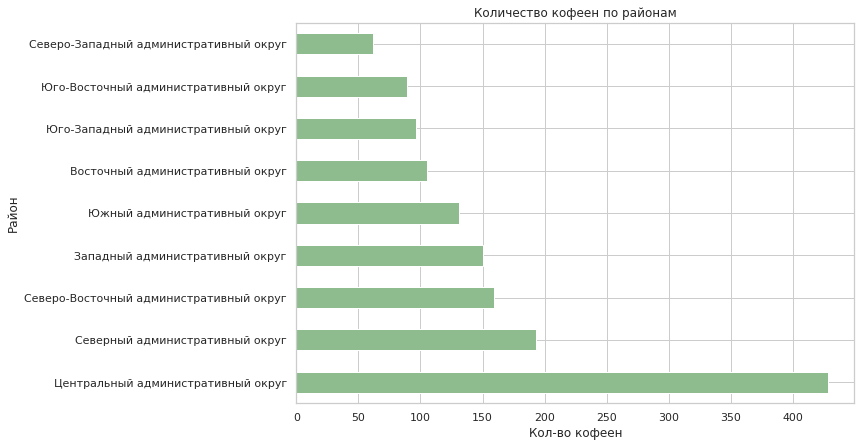

In [63]:
coffee_data.groupby('district')['address'].count().sort_values(ascending=False).plot(kind='barh', y='count', 
                                                                                     figsize=(10, 7), color='darkseagreen')
plt.title("Количество кофеен по районам")
plt.xlabel("Кол-во кофеен")
plt.ylabel("Район")
print('Всего в датасете:',coffee_data['address'].count(),'кофеен') 

In [64]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

coffee_data.apply(create_marker, axis=1)
    

m

In [65]:
coffee_data.groupby('street')['address'].count().sort_values(ascending=False)

street
 проспект Мира             36
 Ленинградский проспект    25
 Ленинский проспект        23
 Профсоюзная улица         18
 проспект Вернадского      16
                           ..
 Мишина улица               1
 Михневская улица           1
 Михалковская улица         1
 Миусская площадь           1
 Петрозаводская улица       1
Name: address, Length: 629, dtype: int64

Каких-то ярких особенностей отличающих данные о местоположении коффеен от данных остальных категорий заведений нет. Многие из них сосредоточены в центре города, другие зачастую сосредоточены рядом с главными дорогами города, ж/д станциями и станциями метро.

In [66]:
coffee_data.groupby('is_24/7')['address'].count().sort_values(ascending=False)

is_24/7
False    1354
True       59
Name: address, dtype: int64

<AxesSubplot:title={'center':'Сетевые и не сетевые кофейни Москвы'}, ylabel=' '>

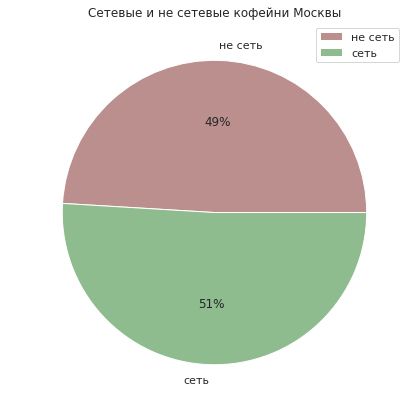

In [67]:
coffee_table=coffee_data.pivot_table(index='is_chain', values='name',aggfunc=['count'])
coffee_table.plot(kind='pie', y='count', figsize=(14, 7), autopct='%1.0f%%', colors=['rosybrown','darkseagreen'] ,
                  ylabel=' ',title ='Сетевые и не сетевые кофейни Москвы',legend='Принадлежность к сети')


In [68]:
coffee_data.groupby('is_chain')['address'].count().sort_values(ascending=False)

is_chain
сеть       720
не сеть    693
Name: address, dtype: int64

In [69]:
coffee_data.loc[(coffee_data['is_chain']==1) & (coffee_data['is_24/7']==1)].groupby('name')['address'].count().sort_values(ascending=False)

Series([], Name: address, dtype: int64)

In [70]:
coffee247=coffee_data.loc[coffee_data['is_24/7']==1].copy()

<AxesSubplot:title={'center':'Сетевые и не сетевые круглосуточные кофейни Москвы'}, ylabel=' '>

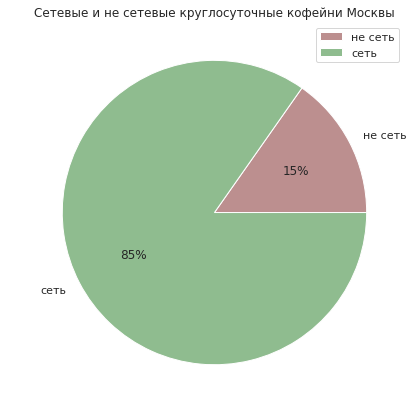

In [71]:
coffee247_table=coffee247.pivot_table(index='is_chain', values='name',aggfunc=['count'])
coffee247_table.plot(kind='pie', y='count', figsize=(14, 7), autopct='%1.0f%%', colors=['rosybrown','darkseagreen'] , 
                     ylabel=' ',title ='Сетевые и не сетевые круглосуточные кофейни Москвы',legend='Принадлежность к сети')


Количество сетевых кофеен в Москве незначительно больше не сетевых, при этом подавляющее большинство московских кофеен не являются круглосуточными. Среди круглосуточных кофеен преобладают сетевые, их 85%.

In [72]:
coffee_data.groupby('price')['address'].count().sort_values(ascending=False)

price
неизвестно       907
средние          383
низкие            92
высокие           17
выше среднего     14
Name: address, dtype: int64

In [73]:
coffee_data.groupby('rating')['address'].count().sort_values(ascending=False)

rating
4.3    261
4.4    228
4.2    202
4.1    170
4.5     95
4.0     78
4.7     77
4.6     61
3.9     38
5.0     37
4.9     37
4.8     29
3.8     25
3.7     19
3.4      9
3.6      7
3.3      7
3.1      7
3.5      4
3.2      4
2.3      4
2.0      3
2.9      3
2.8      3
3.0      2
2.6      1
2.2      1
1.4      1
Name: address, dtype: int64

In [74]:
coffee_rating=coffee_data.pivot_table(index='district', values='rating',aggfunc=['min','median','max','mean'])
coffee_rating.columns = coffee_rating.columns.droplevel(0)
coffee_rating = coffee_rating.reset_index().rename_axis(None, axis=1)
coffee_rating.columns = ['district','min','median','max','mean']
coffee_rating

,district,min,median,max,mean
0,Восточный административный округ,3.0,4.3,5.0,4.282857
1,Западный административный округ,2.3,4.2,5.0,4.195333
2,Северный административный округ,2.0,4.3,5.0,4.291710
3,Северо-Восточный административный округ,1.4,4.3,5.0,4.216981
4,Северо-Западный административный округ,2.0,4.3,5.0,4.325806
5,Центральный административный округ,2.3,4.3,5.0,4.336449
6,Юго-Восточный административный округ,2.3,4.3,5.0,4.225843
7,Юго-Западный административный округ,3.3,4.3,5.0,4.283333
8,Южный административный округ,2.0,4.3,5.0,4.232824


[Text(0.5, 0, 'Рейтинг'),
 Text(0, 0.5, 'Район'),
 Text(0.5, 1.0, 'Распределение среднего рейтинга кофеен по районам')]

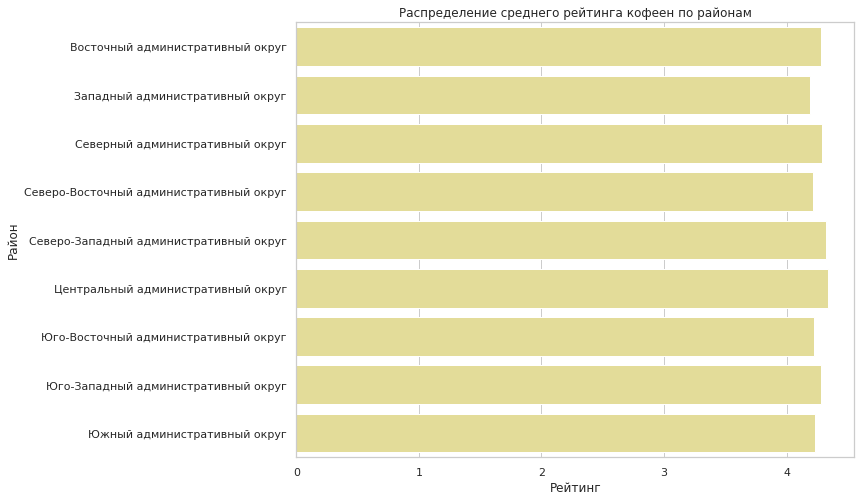

In [75]:
fig_6 = plt.gcf()

fig_6 .set_size_inches(10, 8)
graph_10=sns.barplot(x='mean', y='district',data=coffee_rating, color='khaki')
graph_10.set(xlabel ="Рейтинг", ylabel = 'Район', title ='Распределение среднего рейтинга кофеен по районам')

Средние рейтинги коффеен не сильно рознятся от района к району,они колеблятся в промежутке между 4.2 и 4.3. Самые высокие средние рейтингу у кофеен в Центральном округе, самые низкие - в Западном.

In [76]:
print('Средняя цена за чашку кофе в московкой кофейне:' , coffee_data['middle_coffee_cup'].mean().round(0),'рублей')

Средняя цена за чашку кофе в московкой кофейне: 175.0 рублей


In [77]:
coffee_cup=coffee_data.pivot_table(index='is_chain', values='middle_coffee_cup',aggfunc=['min','median','max','mean'])
coffee_cup.columns = coffee_cup.columns.droplevel(0)
coffee_cup = coffee_cup.reset_index().rename_axis(None, axis=1)
coffee_cup.columns = ['is_chain','min','median','max','mean']
coffee_cup

,is_chain,min,median,max,mean
0,не сеть,60.0,170.0,375.0,177.300380
1,сеть,60.0,154.5,1568.0,172.767442


В целом между средней ценой на кофе в сетевых и не сетевых кофейнях небольшая разница, но интересно, что медианное значение этой цены у сетевых заведений все же ниже почти на 10%. При открытии кофейни можно ориентироваться на среднюю по Москве цену в 175 рублей, но в идеале стоит стремиться к 155 руб., поскольку такая цена чаще встречается у сетевых заведений, которые и так имеют преимущество хорошей узнаваемости у клиентов.

Проверим также зависит ли как-то средняя цена на кофе от района, где кофейня расположена.

In [78]:
coffee_cup_2=coffee_data.pivot_table(index='district', values='middle_coffee_cup',aggfunc=['min','median','max','mean'])
coffee_cup_2.columns = coffee_cup_2.columns.droplevel(0)
coffee_cup_2 = coffee_cup_2.reset_index().rename_axis(None, axis=1)
coffee_cup_2.columns = ['district','min','median','max','mean']
coffee_cup_2

,district,min,median,max,mean
0,Восточный административный округ,60.0,135.0,1568.0,174.023810
1,Западный административный округ,60.0,189.0,300.0,189.938776
2,Северный административный округ,60.0,159.0,325.0,165.789474
3,Северо-Восточный административный округ,60.0,162.5,297.0,165.333333
4,Северо-Западный административный округ,60.0,165.0,270.0,165.523810
5,Центральный административный округ,60.0,190.0,328.0,187.518519
6,Юго-Восточный административный округ,60.0,147.5,375.0,151.088235
7,Юго-Западный административный округ,95.0,198.0,291.0,184.176471
8,Южный административный округ,60.0,150.0,275.0,158.488372


In [79]:
coffee_cup_3=coffee_data.pivot_table(index=['district','is_chain'], values='middle_coffee_cup',aggfunc=['mean'])
coffee_cup_3.columns = coffee_cup_3.columns.droplevel(0)
coffee_cup_3 = coffee_cup_3.reset_index().rename_axis(None, axis=1)

coffee_cup_3

,district,is_chain,middle_coffee_cup
0,Восточный административный округ,не сеть,137.115385
1,Восточный административный округ,сеть,234.000000
2,Западный административный округ,не сеть,196.600000
3,Западный административный округ,сеть,187.000000
4,Северный административный округ,не сеть,173.976744
5,Северный административный округ,сеть,155.121212
6,Северо-Восточный административный округ,не сеть,165.307692
7,Северо-Восточный административный округ,сеть,165.352941
8,Северо-Западный административный округ,не сеть,161.777778
9,Северо-Западный административный округ,сеть,168.333333


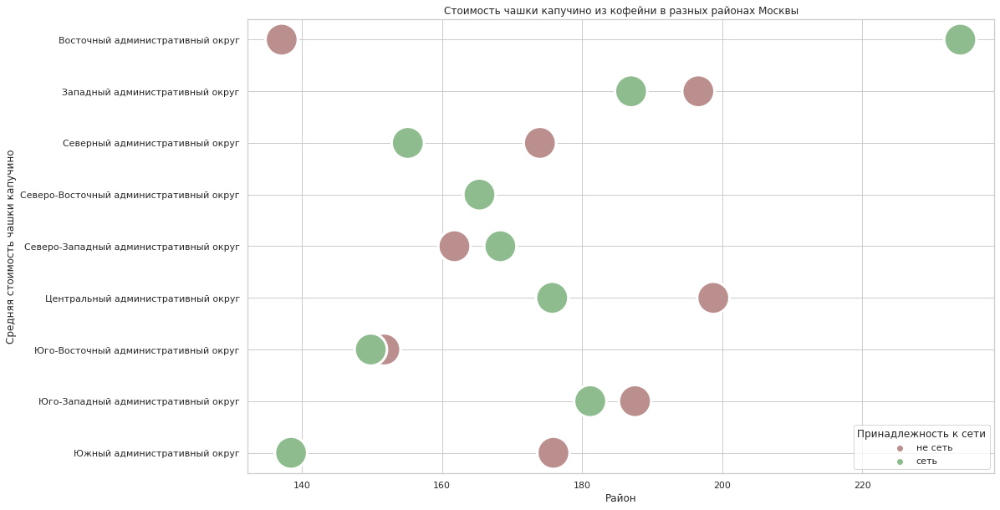

In [80]:
fig_7 = plt.gcf()

fig_7.set_size_inches(16, 10)
graph_11=sns.scatterplot(data=coffee_cup_3, x='middle_coffee_cup', y='district', hue='is_chain', 
                         palette=['rosybrown','darkseagreen'], s=1500)
graph_11.set(xlabel ="Район", ylabel = "Средняя стоимость чашки капучино", 
             title ='Стоимость чашки капучино из кофейни в разных районах Москвы')
graph_11.legend(title="Принадлежность к сети")

При открытии кофейни все-таки необходимо учитывать район, в котором она будет располагаться. В целом в большинстве районов средняя цена за чашку кофе выше в не сетевых заведениях, лишь в Восточном и Северо-Западном округах цены на кофе в сетевых заведених выше. В Северо-Восточном округе средние цены в обоих типах заведений практически идентичны. 

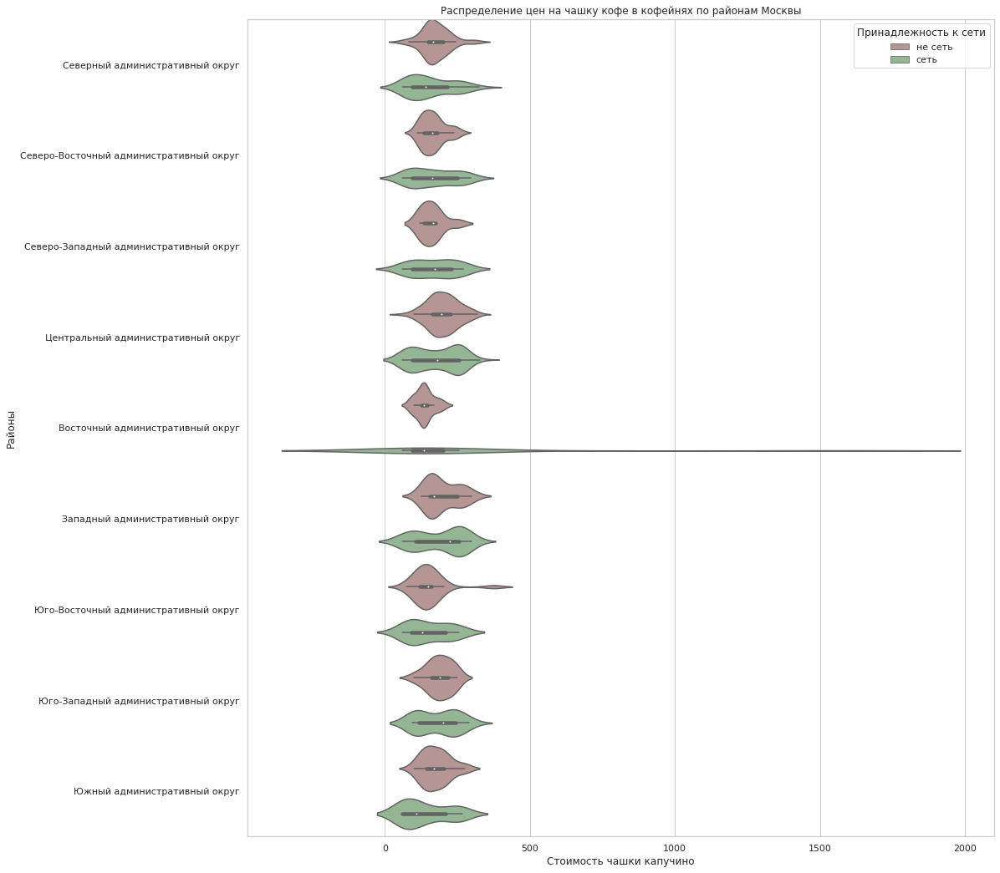

In [81]:
plt.figure(figsize=(16, 18))
sns.violinplot(data=coffee_data,
            x="middle_coffee_cup",
            y="district",
            hue="is_chain",
            dodge=True,   
            width=1,    
            palette = ['rosybrown','darkseagreen'],
       )

plt.title("Распределение цен на чашку кофе в кофейнях по районам Москвы")
plt.xlabel("Стоимость чашки капучино")
plt.ylabel("Районы")
plt.legend(title="Принадлежность к сети")
plt.show()

Проверим с чем связан такой выброс в ценах Восточного округа.

In [82]:
coffee_data.loc[(coffee_data['district']=='Восточный административный округ') & (coffee_data['middle_coffee_cup'].notna())]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_chain,street,is_24/7
404,2168,Кофейня Калдис в проезде Сокольнического Круга,кофейня,"Москва, проезд Сокольнического Круга, 2А",Восточный административный округ,"ежедневно, 09:00–22:00",55.793747,37.675261,4.4,средние,Цена чашки капучино:140–200 ₽,NaN,170.0,0,NaN,не сеть,проезд Сокольнического Круга,False
406,2172,Шоколадница,кофейня,"Москва, Сокольническая площадь, 4А",Восточный административный округ,"ежедневно, 08:00–23:00",55.789566,37.678720,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,60.0,сеть,Сокольническая площадь,False
423,2267,18 Грамм,кофейня,"Москва, Погонный проезд, 3А, корп. 5",Восточный административный округ,"ежедневно, 08:00–22:00",55.819762,37.701331,4.4,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,1,252.0,сеть,Погонный проезд,False
428,2283,Альпини,кофейня,"Москва, улица Гастелло, 41",Восточный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.783215,37.695393,4.3,средние,Цена чашки капучино:120–150 ₽,NaN,135.0,0,NaN,не сеть,улица Гастелло,False
441,2323,9 Bar Coffee,кофейня,"Москва, Стромынский переулок, 4",Восточный административный округ,"пн-пт 08:00–20:00; сб,вс 08:00–18:00",55.793241,37.694106,4.3,неизвестно,Цена чашки капучино:130–230 ₽,NaN,180.0,1,0.0,сеть,Стромынский переулок,False
476,2499,One Price Coffee,кофейня,"Москва, Сокольническая площадь, 4к1-2",Восточный административный округ,"ежедневно, 08:00–20:00",55.789975,37.677932,3.1,неизвестно,Цена чашки капучино:60–100 ₽,NaN,80.0,1,NaN,сеть,Сокольническая площадь,False
482,2519,Buon,кофейня,"Москва, Краснобогатырская улица, 2, стр. 1",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 09:00–19:30",55.814831,37.693388,3.4,низкие,Цена чашки капучино:90–180 ₽,NaN,135.0,0,167.0,не сеть,Краснобогатырская улица,False
490,2576,Кофейная история,кофейня,"Москва, Большая Семёновская улица, 10, стр. 13",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 10:00–20:00",55.782477,37.702322,5.0,неизвестно,Цена чашки капучино:119–149 ₽,NaN,134.0,0,NaN,не сеть,Большая Семёновская улица,False
491,2582,Ранние пташки,кофейня,"Москва, Нижняя Первомайская улица, 35/9",Восточный административный округ,"ежедневно, 09:00–21:00",55.791380,37.805344,4.9,средние,Цена чашки капучино:130 ₽,NaN,130.0,0,NaN,не сеть,Нижняя Первомайская улица,False
493,2586,Эссе,кофейня,"Москва, Никитинская улица, 13",Восточный административный округ,"пн-пт 10:00–23:00; сб,вс 11:00–23:00",55.799008,37.774776,4.7,средние,Цена чашки капучино:200 ₽,NaN,200.0,0,NaN,не сеть,Никитинская улица,False


In [83]:
coffee_data['middle_coffee_cup'].loc[(coffee_data['name']=='Шоколадница') & (coffee_data['middle_coffee_cup'].notna())].unique()

array([ 256.,  214.,  287.,  220.,  325.,  266.,  170.,  250., 1568.,
        291.,  260.,  246.,  227.])

Видимо в данных была допущена ошибка, поскольку крайне маловероятно, что лишь в одном заведении крупной сети средняя цена на одну и ту же категорию меню так сильно отличается, учитывая, что обычно меню и ценовая политика у таких заведений едина для каждого филиала сети. Удалим эту строчку из датафрейма.

In [84]:
coffee_data=coffee_data.drop(coffee_data.loc[(coffee_data['name']=='Шоколадница') & (coffee_data['middle_coffee_cup']>1500)]
                             .index)

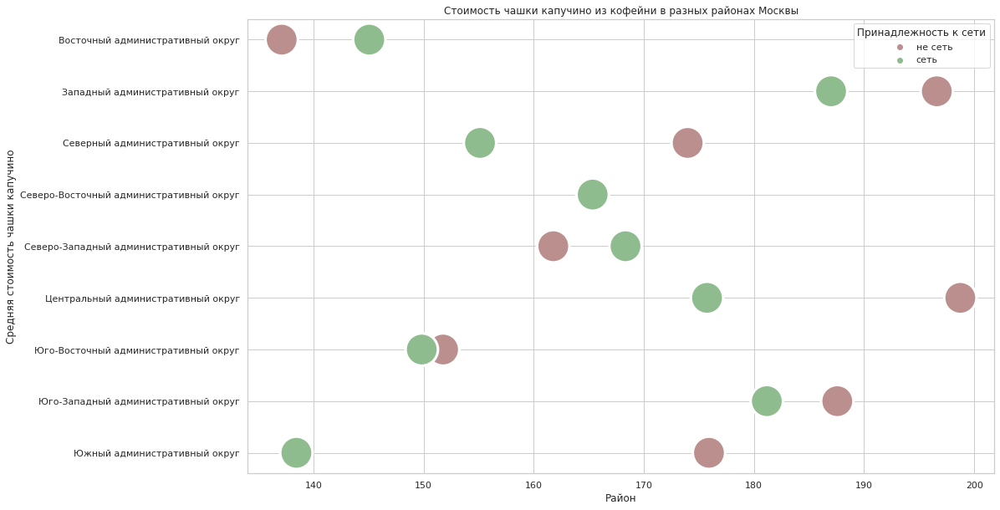

In [85]:
coffee_cup_4=coffee_data.pivot_table(index=['district','is_chain'], values='middle_coffee_cup',aggfunc=['mean'])
coffee_cup_4.columns = coffee_cup_4.columns.droplevel(0)
coffee_cup_4 = coffee_cup_4.reset_index().rename_axis(None, axis=1)

fig_7 = plt.gcf()

fig_7.set_size_inches(16, 10)
graph_12=sns.scatterplot(data=coffee_cup_4, x='middle_coffee_cup', y='district', hue='is_chain', 
                         palette=['rosybrown','darkseagreen'], s=1500)
graph_12.set(xlabel ="Район", ylabel = "Средняя стоимость чашки капучино",
             title ='Стоимость чашки капучино из кофейни в разных районах Москвы')
graph_12.legend(title="Принадлежность к сети")

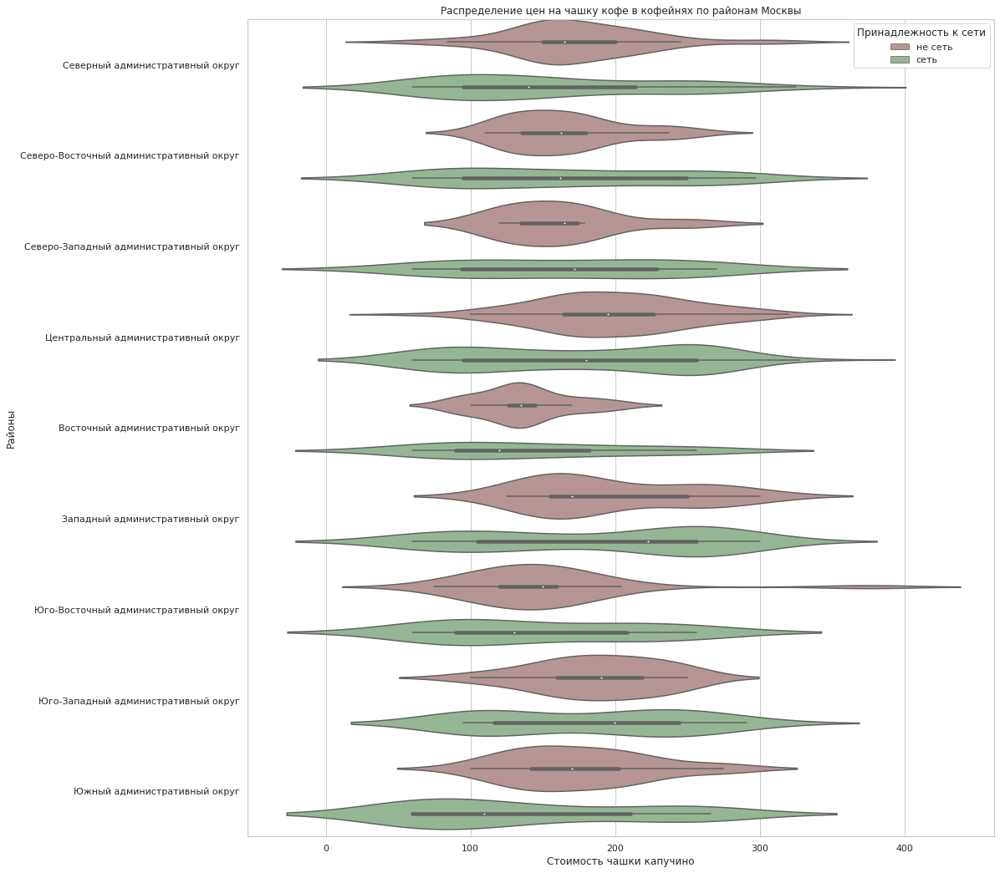

In [86]:
plt.figure(figsize=(16, 18))
sns.violinplot(data=coffee_data,
            x="middle_coffee_cup",
            y="district",
            hue="is_chain",
            dodge=True,   
            width=1,    
            palette = ['rosybrown','darkseagreen'],
       )

plt.title("Распределение цен на чашку кофе в кофейнях по районам Москвы")
plt.xlabel("Стоимость чашки капучино")
plt.ylabel("Районы")
plt.legend(title="Принадлежность к сети")
plt.show()

Теперь заметных выбросов на визуализации нет.


При изучении данных о кофейнях в Москве было выявлено, что:
  1. Большинство кофеен сосредоточено в центре города, другие зачастую сосредоточены рядом с главными дорогами города, ж/д станциями и станциями метро.
  2. Количество сетевых кофеен в Москве незначительно больше не сетевых, при этом подавляющее большинство Московских кофеен не являются круглосуточными. 
  3. Средние рейтинги коффеен не сильно рознятся от района к району, самые высокие средние рейтингу у кофеен в Центральном округе, самые низкие - в Западном.
  4. Большинстве районов средняя цена за чашку кофе выше в не сетевых заведениях, лишь в Восточном и Северо-Западном округах цены на кофе в сетевых заведених выше. 

Таким образом, при открытии новой, не сетевой кофейни необходимо учитывать цену на чашку кофе и ее местоположение. Хорошим местом для открытия кофейни могут быть Северо-Западный и Юго-Западный округи, поскольку они являются наименее насыщенными кофейнями районами города, а также в них не самые низкие средние цены на кофе, то есть можно будет со средней ценой за чашку 160-165 конкурировать с другими заведениями, а не опускать цены до самых низких средних значений.

<div class="alert alert-success">
<b> Ссылка на презентацию по результатам исследования: https://disk.yandex.ru/i/_pmnOsMViqhi6A